# Nezařazené filtry

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

from skimage import img_as_float32, img_as_ubyte
from skimage.filters import butterworth, hessian

from PIL import Image, ImageFilter

In [2]:
DATA_PATH = f'../../Results/Resizing_Images/Images_ALL/2023_12_14_image_000.png'

img = cv2.imread(DATA_PATH)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img_float = img_as_float32(img)
img_pil = Image.fromarray(img, 'RGB')

In [3]:
def plot_images(img_ori,img_fil, title):

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,9))

    ax1.title.set_text('Original image')
    ax1.imshow(img_ori)

    ax2.title.set_text(f'{title}')
    ax2.imshow(img_fil)

    plt.show()

## OpenCV

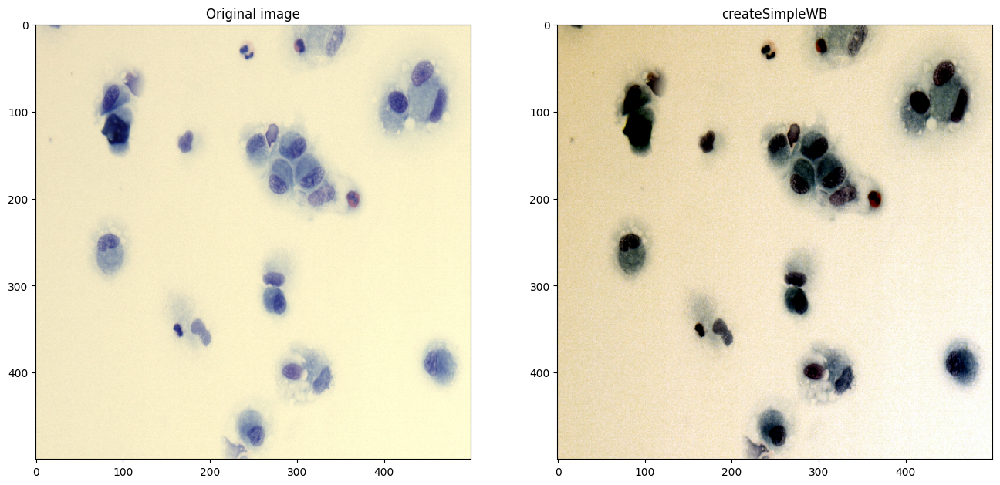

In [4]:
S_wb = cv2.xphoto.createSimpleWB()
img_filtered = S_wb.balanceWhite(img)

plot_images(img,img_filtered,'createSimpleWB')

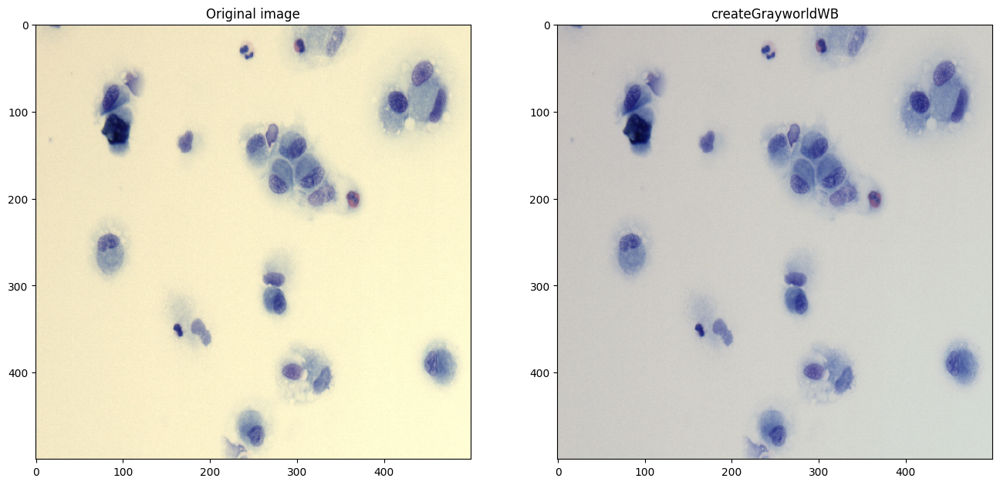

In [5]:
GW_wb = cv2.xphoto.createGrayworldWB()
img_filtered = GW_wb.balanceWhite(img)

plot_images(img,img_filtered,'createGrayworldWB')

## skimage

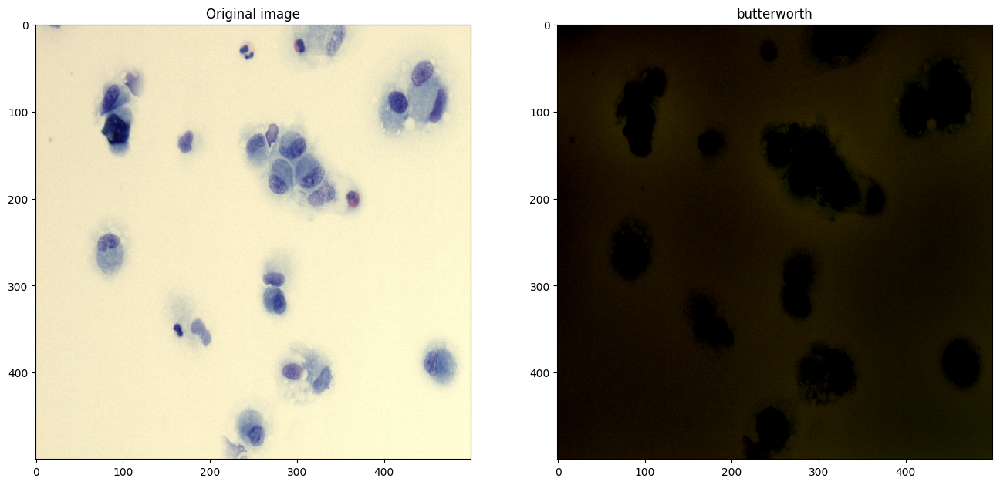

In [6]:
img_filtered = butterworth(img_float)
img_filtered = img_as_ubyte(img_filtered)

plot_images(img, img_filtered, 'butterworth')

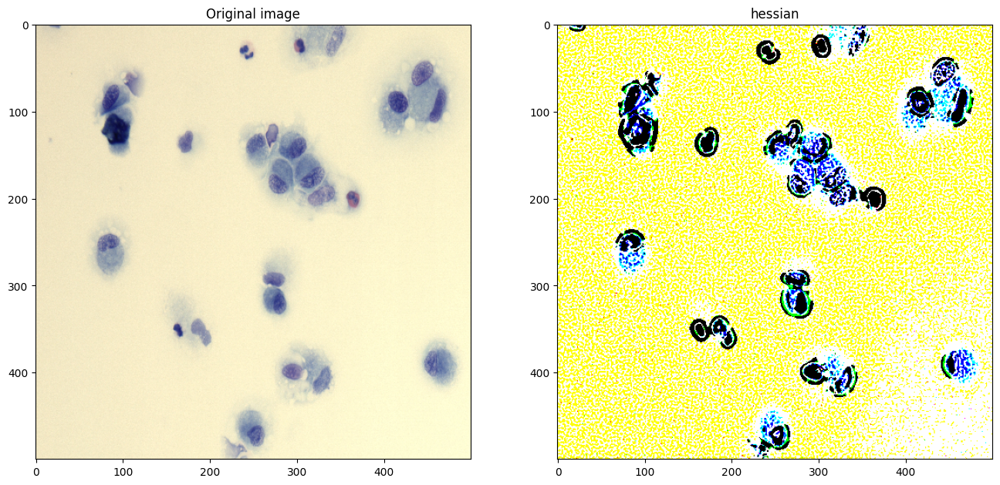

In [7]:
img_filtered = hessian(img_float)
img_filtered = img_as_ubyte(img_filtered)

plot_images(img,img_filtered,'hessian')

## PIL

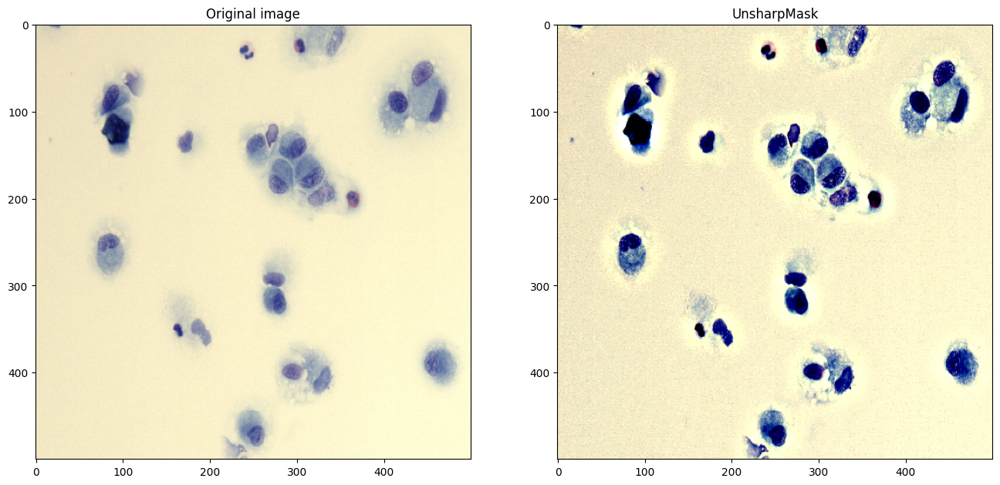

In [8]:
img_filtered = img_pil.filter(ImageFilter.UnsharpMask(radius = 10, percent = 300, threshold = 3))
img_filtered = np.asarray(img_filtered)

plot_images(img,img_filtered,'UnsharpMask')

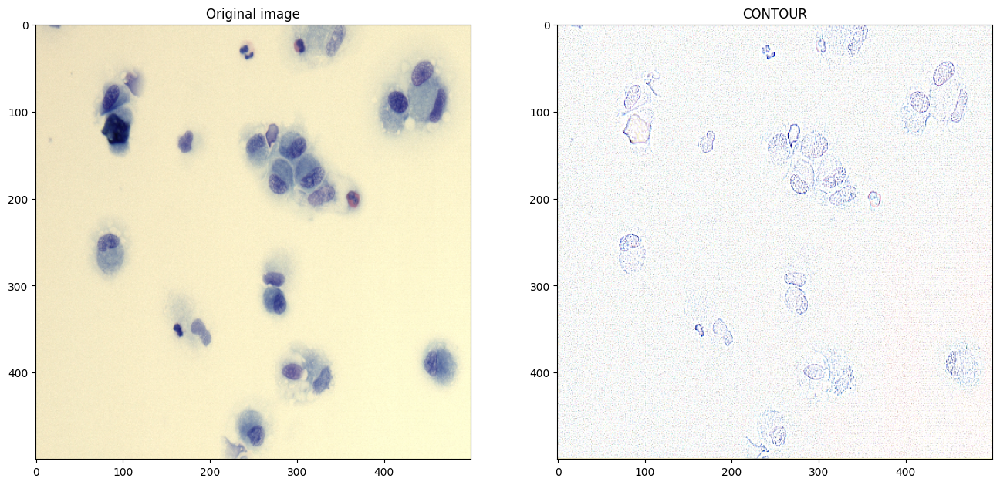

In [9]:
img_filtered = img_pil.filter(ImageFilter.CONTOUR)
img_filtered = np.asarray(img_filtered)

plot_images(img,img_filtered,'CONTOUR')

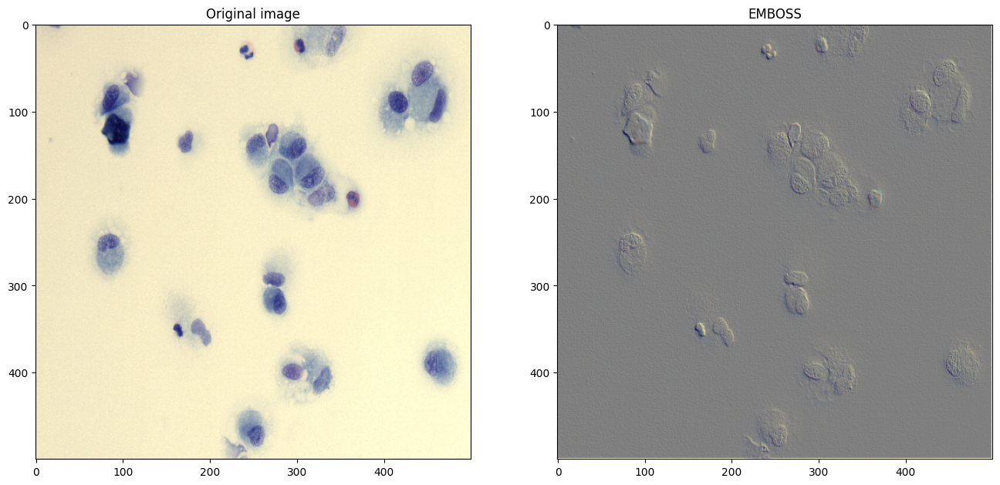

In [10]:
img_filtered = img_pil.filter(ImageFilter.EMBOSS)
img_filtered = np.asarray(img_filtered)

plot_images(img,img_filtered,'EMBOSS')

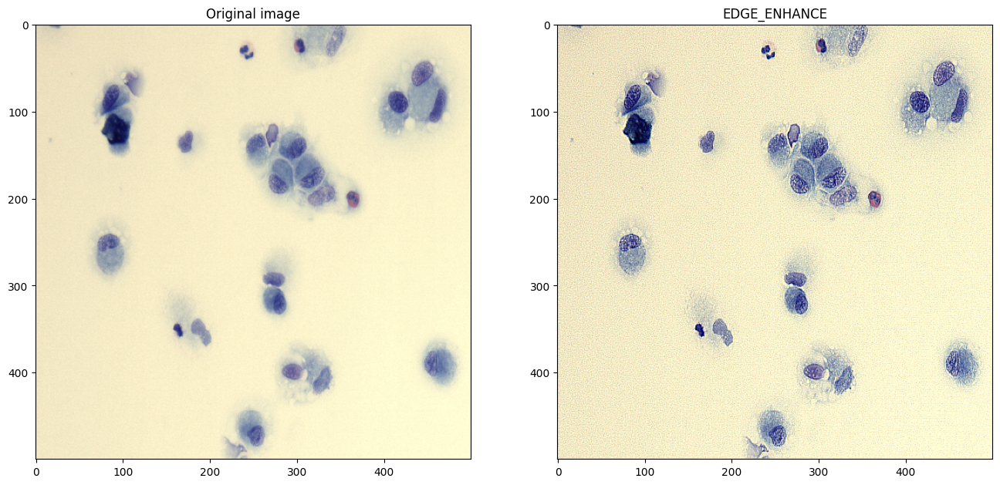

In [11]:
img_filtered = img_pil.filter(ImageFilter.EDGE_ENHANCE)
img_filtered = np.asarray(img_filtered)

plot_images(img,img_filtered,'EDGE_ENHANCE')

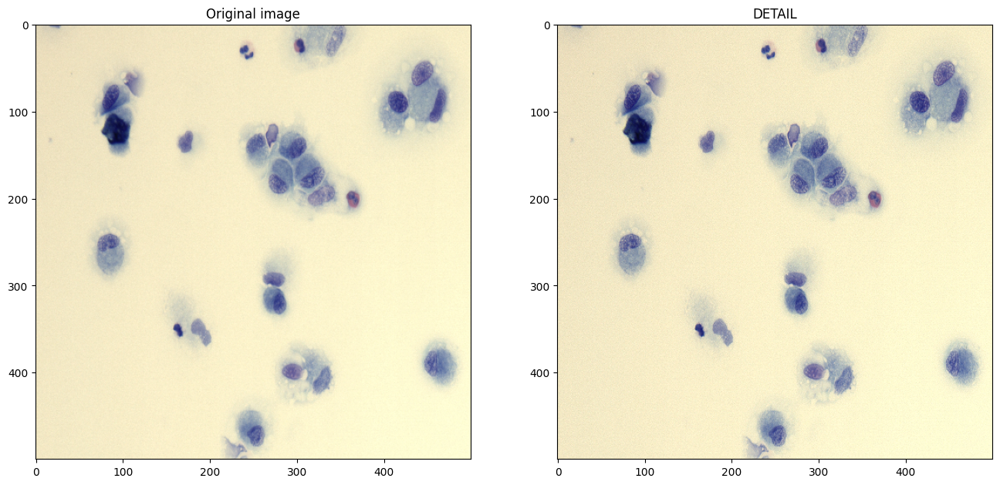

In [12]:
img_filtered = img_pil.filter(ImageFilter.DETAIL)
img_filtered = np.asarray(img_filtered)

plot_images(img,img_filtered,'DETAIL')